In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.linear_model import SGDClassifier
from sklearn.svm import LinearSVC
from sklearn.neighbors import RadiusNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

The case chosen is about predicting the bankruptcy of companies based on their financial data. The data was collected from the Taiwan Economic Journal for the years 1999 to 2009. Company bankruptcy was defined based on the business regulations of the Taiwan Stock Exchange. The dataset provided has already been standardized and all missing values were previously replaced with 0

In [ ]:
#Overview of Data

In [ ]:
# Load data from CSV file
bankruptcy_df = pd.read_csv(r'C:\Users\azizm\Documents\BDA-398B-Final-Project\bankruptcy.csv', sep=',', header=0, encoding='utf-8', engine='python', on_bad_lines='warn')


bankruptcy_df.head(20)

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490
5,1,0.388680,0.415177,0.419134,0.590171,0.590251,0.998758,0.796903,0.808771,0.303116,...,0.710420,0.005278,0.622605,0.590172,0.829939,0.285087,0.026675,0.564538,1,0.019534
6,0,0.390923,0.445704,0.436158,0.619950,0.619950,0.998993,0.797012,0.808960,0.302814,...,0.736619,0.018372,0.623655,0.619949,0.829980,0.292504,0.026622,0.564200,1,0.015663
7,0,0.508361,0.570922,0.559077,0.601738,0.601717,0.999009,0.797449,0.809362,0.303545,...,0.815350,0.010005,0.623843,0.601739,0.841459,0.278607,0.027031,0.566089,1,0.034889
8,0,0.488519,0.545137,0.543284,0.603612,0.603612,0.998961,0.797414,0.809338,0.303584,...,0.803647,0.000824,0.623977,0.603613,0.840487,0.276423,0.026891,0.565592,1,0.065826
9,0,0.495686,0.550916,0.542963,0.599209,0.599209,0.999001,0.797404,0.809320,0.303483,...,0.804195,0.005798,0.623865,0.599205,0.840688,0.279388,0.027243,0.566668,1,0.030801


In [3]:
# Display the number of rows in the DataFrame
print(f"Number of rows: {len(bankruptcy_df)}")

Number of rows: 6819


In [4]:
FEATURES = bankruptcy_df.columns.tolist()
FEATURES.remove('Bankrupt?')
XFeatures = FEATURES

# Print the list of features
print("List of features:")
for feature in XFeatures:
    print(feature)

List of features:
 ROA(C) before interest and depreciation before interest
 ROA(A) before interest and % after tax
 ROA(B) before interest and depreciation after tax
 Operating Gross Margin
 Realized Sales Gross Margin
 Operating Profit Rate
 Pre-tax net Interest Rate
 After-tax net Interest Rate
 Non-industry income and expenditure/revenue
 Continuous interest rate (after tax)
 Operating Expense Rate
 Research and development expense rate
 Cash flow rate
 Interest-bearing debt interest rate
 Tax rate (A)
 Net Value Per Share (B)
 Net Value Per Share (A)
 Net Value Per Share (C)
 Persistent EPS in the Last Four Seasons
 Cash Flow Per Share
 Revenue Per Share (Yuan ¥)
 Operating Profit Per Share (Yuan ¥)
 Per Share Net profit before tax (Yuan ¥)
 Realized Sales Gross Profit Growth Rate
 Operating Profit Growth Rate
 After-tax Net Profit Growth Rate
 Regular Net Profit Growth Rate
 Continuous Net Profit Growth Rate
 Total Asset Growth Rate
 Net Value Growth Rate
 Total Asset Return Growt

In [5]:
bankruptcy_df.shape

(6819, 96)

In [6]:
# Get an overview of the dataset
print(bankruptcy_df.head())

# Get summary statistics
print(bankruptcy_df.describe())

# Get data types and missing values
print(bankruptcy_df.info())

   Bankrupt?   ROA(C) before interest and depreciation before interest  \
0          1                                           0.370594          
1          1                                           0.464291          
2          1                                           0.426071          
3          1                                           0.399844          
4          1                                           0.465022          

    ROA(A) before interest and % after tax  \
0                                 0.424389   
1                                 0.538214   
2                                 0.499019   
3                                 0.451265   
4                                 0.538432   

    ROA(B) before interest and depreciation after tax  \
0                                           0.405750    
1                                           0.516730    
2                                           0.472295    
3                                           0.4577

In [7]:
bankruptcy_df[bankruptcy_df.isnull().any(axis=1)].count()

Bankrupt?                                                   0
 ROA(C) before interest and depreciation before interest    0
 ROA(A) before interest and % after tax                     0
 ROA(B) before interest and depreciation after tax          0
 Operating Gross Margin                                     0
                                                           ..
 Liability to Equity                                        0
 Degree of Financial Leverage (DFL)                         0
 Interest Coverage Ratio (Interest expense to EBIT)         0
 Net Income Flag                                            0
 Equity to Liability                                        0
Length: 96, dtype: int64

In [8]:
bankruptcy_df.shape

(6819, 96)

In [9]:
names_of_x_cols = bankruptcy_df.columns.drop(['Bankrupt?', ' Net Income Flag'])

In [10]:
bankruptcy_df.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,1.0,0.047578
std,0.176710,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.0,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000


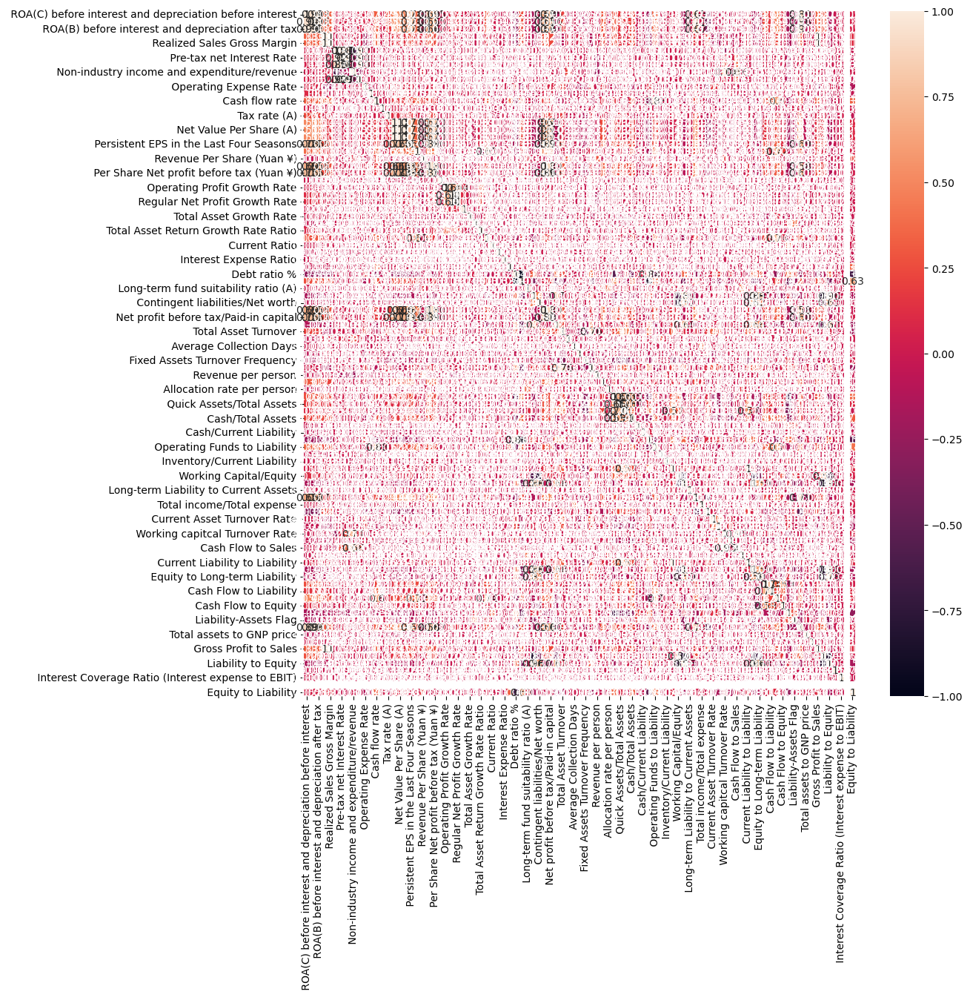

In [11]:
import seaborn as sns

X_features_df = bankruptcy_df[XFeatures]
X_features_corr = X_features_df.corr()
plt.figure(figsize=(12, 12))
sns.heatmap(X_features_corr, annot=True)
plt.show()

In [12]:
#hints at multicolinearity

In [13]:
result_dict = {}

In [ ]:
#V1 Testing of Model without any modifications to the data

In [14]:
def summarize_classification(y_test, y_pred):
    
    acc = accuracy_score(y_test, y_pred, normalize=True)
    num_acc = accuracy_score(y_test, y_pred, normalize=False)
    
    return {'accuracy': acc}

In [15]:
def random_forest_fn(x_train, y_train, max_depth=None, max_features=None): 
    
    model = RandomForestClassifier(n_estimators = 100) 
    model.fit(x_train, y_train)
    
    return model

In [16]:
def build_model(classifier_fn,                
                name_of_y_col, 
                names_of_x_cols, 
                dataset, 
                test_frac=0.2):
    
    X = dataset[names_of_x_cols]
    Y = dataset[name_of_y_col]

    x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=test_frac)
       
    model = classifier_fn(x_train, y_train)
    
    y_pred = model.predict(x_test)

    test_summary = summarize_classification(y_test, y_pred)
    
    pred_results = pd.DataFrame({'y_test': y_test,
                                 'y_pred': y_pred})
    
    model_crosstab = pd.crosstab(pred_results.y_pred, pred_results.y_test)
    
    return {'test': test_summary,
            'confusion_matrix': model_crosstab}

In [17]:
def compare_results():
    for key in result_dict:
        print('Classification: ', key)

        print()
        print('Test data')
        for score in result_dict[key]['test']:
            print(score, result_dict[key]['test'][score])
       
        print()

In [18]:
result_dict['Bankrupt? ~ random_forest'] = build_model(random_forest_fn,
                                                 'Bankrupt?',
                                                  XFeatures,
                                                  bankruptcy_df)

compare_results()

Classification:  Bankrupt? ~ random_forest

Test data
accuracy 0.9750733137829912



In [19]:
#V1 High accuracy shows that data has most likely been preprocessed and features carefully selected before the dataset  wasprovided

In [ ]:
#V2P1 Using Select K best to use less features for model and hypothesis testing

In [20]:
X = bankruptcy_df.drop('Bankrupt?', axis=1) # Features
y = bankruptcy_df['Bankrupt?'] # Target variable

In [21]:
from sklearn.feature_selection import VarianceThreshold

# Create the VarianceThreshold object with a threshold of 0 to remove constant features
selector = VarianceThreshold(threshold=0)

# Fit the selector on your feature matrix X
selector.fit(X)

# Transform the feature matrix by keeping only the non-constant features
X_filtered = selector.transform(X)

In [22]:
from sklearn.feature_selection import f_classif, SelectKBest
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

# Prepare the data
X = bankruptcy_df.drop('Bankrupt?', axis=1)  # Features
y = bankruptcy_df['Bankrupt?']  # Target variable

# Create a pipeline for the feature selection and logistic regression model
pipe = Pipeline([
    ('select_features', SelectKBest(f_classif)),
    ('logistic', LogisticRegression(solver='liblinear'))
])

# Set up the grid search with a range of 'k' values up to 10
param_grid = {
    'select_features__k': range(1, 11)
}

# Perform the grid search with cross-validation
grid_search = GridSearchCV(pipe, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X, y)

# Print the best 'k' and its corresponding score
print("Best k for feature selection:", grid_search.best_params_['select_features__k'])
print("Best score:", grid_search.best_score_)

# Print the results for all 'k' values
print("\nResults for all 'k' values:")
for k, mean_test_score in zip(param_grid['select_features__k'], grid_search.cv_results_['mean_test_score']):
    print(f"k = {k}: {mean_test_score:.4f}")

C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [93] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [93] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [93] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Us

C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [93] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [93] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [93] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Us

Best k for feature selection: 7
Best score: 0.9684704474991556

Results for all 'k' values:
k = 1: 0.9674
k = 2: 0.9680
k = 3: 0.9680
k = 4: 0.9676
k = 5: 0.9679
k = 6: 0.9682
k = 7: 0.9685
k = 8: 0.9682
k = 9: 0.9682
k = 10: 0.9682


C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [93] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [93] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [93] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Us

In [23]:
from sklearn.feature_selection import f_classif, SelectKBest
from numpy import array 

select_features = SelectKBest(f_classif, k=7)

X = bankruptcy_df.drop('Bankrupt?', axis=1)  # Features
y = bankruptcy_df['Bankrupt?']  # Target variable

X_filtered = select_features.fit_transform(X, y)
filter_mask = select_features.get_support()
selected_features = array(list(X.columns))

# Create a DataFrame with only the selected features
X_filtered = pd.DataFrame(X_filtered, columns=selected_features[filter_mask])

print("All features:")
print(selected_features)

print("\nSelected best 7:")
print(selected_features[filter_mask])

print("\nX_filtered:")
print(X_filtered.head())

All features:
[' ROA(C) before interest and depreciation before interest'
 ' ROA(A) before interest and % after tax'
 ' ROA(B) before interest and depreciation after tax'
 ' Operating Gross Margin' ' Realized Sales Gross Margin'
 ' Operating Profit Rate' ' Pre-tax net Interest Rate'
 ' After-tax net Interest Rate'
 ' Non-industry income and expenditure/revenue'
 ' Continuous interest rate (after tax)' ' Operating Expense Rate'
 ' Research and development expense rate' ' Cash flow rate'
 ' Interest-bearing debt interest rate' ' Tax rate (A)'
 ' Net Value Per Share (B)' ' Net Value Per Share (A)'
 ' Net Value Per Share (C)' ' Persistent EPS in the Last Four Seasons'
 ' Cash Flow Per Share' ' Revenue Per Share (Yuan ¥)'
 ' Operating Profit Per Share (Yuan ¥)'
 ' Per Share Net profit before tax (Yuan ¥)'
 ' Realized Sales Gross Profit Growth Rate'
 ' Operating Profit Growth Rate' ' After-tax Net Profit Growth Rate'
 ' Regular Net Profit Growth Rate' ' Continuous Net Profit Growth Rate'
 ' 

C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [93] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Users\azizm\anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


In [24]:
from scipy.stats import f_oneway

# Get the selected features
selected_features_filter = grid_search.best_estimator_.named_steps['select_features'].get_support()
selected_features = X.columns[selected_features_filter]

# Perform hypothesis testing for each selected feature
results = []

for feature in selected_features:
    group1 = bankruptcy_df[bankruptcy_df['Bankrupt?'] == 0][feature]
    group2 = bankruptcy_df[bankruptcy_df['Bankrupt?'] == 1][feature]
    
    f_stat, p_value = f_oneway(group1, group2)
    results.append((feature, f_stat, p_value))

# Sort the results by p-value
results.sort(key=lambda x: x[2])

# Print the results
print("Feature\tF-statistic\tp-value")
for result in results:
    print(f"{result[0]}\t{result[1]:.4f}\t{result[2]:.4e}")

Feature	F-statistic	p-value
 Net Income to Total Assets	753.3489	2.0981e-157
 ROA(A) before interest and % after tax	593.2286	1.0337e-125
 ROA(B) before interest and depreciation after tax	549.2021	7.0946e-117
 ROA(C) before interest and depreciation before interest	497.5351	1.9508e-106
 Debt ratio %	455.0912	8.3740e-98
 Net worth/Assets	455.0912	8.3740e-98
 Persistent EPS in the Last Four Seasons	345.2675	3.2012e-75


In [ ]:
#Hypothesis testing on the best features selected, all features are significant with net income to assets being the most

In [25]:
from sklearn.linear_model import LogisticRegression

def logistic_fn(x_train, y_train):
    model = LogisticRegression(solver='liblinear')
    model.fit(x_train, y_train)
    return model

# Use the filtered features for training the logistic regression model
X_filtered_train = X_filtered  # Rename for clarity
model = logistic_fn(X_filtered_train, y)

# Now you can use the model to make predictions, evaluate performance, etc.

In [26]:
X_filtered_df = bankruptcy_df[selected_features]

In [27]:
result_dict['bankruptcy ~ logistic_filtered'] = build_model(logistic_fn,
                                                            'Bankrupt?',
                                                            X_filtered_df.columns,
                                                            bankruptcy_df)
compare_results()

Classification:  Bankrupt? ~ random_forest

Test data
accuracy 0.9750733137829912

Classification:  bankruptcy ~ logistic_filtered

Test data
accuracy 0.969208211143695



In [28]:
# Train the random forest model using the column names of the filtered X data
result_dict['Bankrupt? ~ random_forest_filtered'] = build_model(random_forest_fn,
                                                                'Bankrupt?',
                                                                X_filtered.columns,
                                                                bankruptcy_df)

compare_results()

Classification:  Bankrupt? ~ random_forest

Test data
accuracy 0.9750733137829912

Classification:  bankruptcy ~ logistic_filtered

Test data
accuracy 0.969208211143695

Classification:  Bankrupt? ~ random_forest_filtered

Test data
accuracy 0.9706744868035191



In [29]:
def decision_tree_fn(x_train, y_train, max_depth=None, max_features=None): 
    
    model = DecisionTreeClassifier(max_depth=max_depth, max_features=max_features)
    model.fit(x_train, y_train)
    
    return model

In [30]:
result_dict['bankruptcy ~ decision_tree_filtered'] = build_model(decision_tree_fn,
                                                 'Bankrupt?',
                                                  X_filtered.columns,
                                                  bankruptcy_df)

compare_results()

Classification:  Bankrupt? ~ random_forest

Test data
accuracy 0.9750733137829912

Classification:  bankruptcy ~ logistic_filtered

Test data
accuracy 0.969208211143695

Classification:  Bankrupt? ~ random_forest_filtered

Test data
accuracy 0.9706744868035191

Classification:  bankruptcy ~ decision_tree_filtered

Test data
accuracy 0.9545454545454546



In [31]:
def knn_fn(x_train, y_train, max_depth=None, max_features=None): 
    
    model = KNeighborsClassifier(n_neighbors = 5)
    model.fit(x_train, y_train)
    
    return model

In [32]:
import pandas as pd

# Convert the NumPy array to a pandas DataFrame using the selected features
X_filtered_df = pd.DataFrame(X_filtered, columns=selected_features)

# Build the KNN model using X_filtered_df
result_dict['bankruptcy ~ knn_filtered'] = build_model(knn_fn, 'Bankrupt?', X_filtered_df.columns, bankruptcy_df)

# Compare the results
compare_results()

Classification:  Bankrupt? ~ random_forest

Test data
accuracy 0.9750733137829912

Classification:  bankruptcy ~ logistic_filtered

Test data
accuracy 0.969208211143695

Classification:  Bankrupt? ~ random_forest_filtered

Test data
accuracy 0.9706744868035191

Classification:  bankruptcy ~ decision_tree_filtered

Test data
accuracy 0.9545454545454546

Classification:  bankruptcy ~ knn_filtered

Test data
accuracy 0.968475073313783



In [33]:
# for V2P1 no matter what model we used the accuracy of the model based on all the original data is better this may hint at a loss of information however the accuracy is still very high so the information removed is not a main determinant

In [ ]:
#V2P2 Using Variance threshoild to select best features

In [34]:
import numpy as np
import pandas as pd

# Extract the features and target variable into separate variables
features = bankruptcy_df.drop("Bankrupt?", axis=1)

# Calculate the variance of each feature using numpy.var
variances = np.var(features, axis=0)

# Print the variances for each feature
for i, var in enumerate(variances):
    print(f"Variance of feature {i}: {var:.4f}")

Variance of feature 0: 0.0037
Variance of feature 1: 0.0043
Variance of feature 2: 0.0038
Variance of feature 3: 0.0003
Variance of feature 4: 0.0003
Variance of feature 5: 0.0002
Variance of feature 6: 0.0002
Variance of feature 7: 0.0002
Variance of feature 8: 0.0001
Variance of feature 9: 0.0002
Variance of feature 10: 10481059711864074240.0000
Variance of feature 11: 6750128954264614912.0000
Variance of feature 12: 0.0003
Variance of feature 13: 11721763648685860.0000
Variance of feature 14: 0.0192
Variance of feature 15: 0.0011
Variance of feature 16: 0.0011
Variance of feature 17: 0.0011
Variance of feature 18: 0.0011
Variance of feature 19: 0.0003
Variance of feature 20: 2673231047923748.5000
Variance of feature 21: 0.0008
Variance of feature 22: 0.0011
Variance of feature 23: 0.0001
Variance of feature 24: 0.0001
Variance of feature 25: 0.0002
Variance of feature 26: 0.0002
Variance of feature 27: 0.0001
Variance of feature 28: 8395536903103686656.0000
Variance of feature 29: 1

In [ ]:
#we can see a big split in variance so I decided to put the threshold at 1000 so we are left with the data with the highest variance

In [35]:
from sklearn.feature_selection import VarianceThreshold
from scipy.stats import f_oneway
import pandas as pd

# Drop the target variable 'Bankrupt?' before applying the feature selection method
X = bankruptcy_df.drop(columns=['Bankrupt?'])

# Create the VarianceThreshold object with a threshold of 0 to remove constant features
selector = VarianceThreshold(threshold=1000)

# Fit the selector on your feature matrix X
selector.fit(X)

# Transform the feature matrix by keeping only the non-constant features
X_filtered1 = selector.transform(X)

# Get the selected features
selected_features_filter1 = selector.get_support()
selected_features1 = X.columns[selected_features_filter1]

# Create a new DataFrame with only the selected features and the target variable
selected_df1 = bankruptcy_df[selected_features1]
selected_df1['Bankrupt?'] = bankruptcy_df['Bankrupt?']

# Perform hypothesis testing for each selected feature
results = []

for feature in selected_features1:
    group1 = selected_df1[selected_df1['Bankrupt?'] == 0][feature]
    group2 = selected_df1[selected_df1['Bankrupt?'] == 1][feature]
    
    f_stat, p_value = f_oneway(group1, group2)
    results.append((feature, f_stat, p_value))

# Sort the results by p-value
results.sort(key=lambda x: x[2])

# Print the results
print("Feature\tF-statistic\tp-value")
for result in results:
    print(f"{result[0]}\t{result[1]:.4f}\t{result[2]:.4e}")

Feature	F-statistic	p-value
 Cash/Current Liability	41.6436	1.1704e-10
 Fixed Assets Turnover Frequency	36.3398	1.7439e-09
 Fixed Assets to Assets	30.1236	4.1996e-08
 Net Value Growth Rate	29.2192	6.6826e-08
 Total Asset Growth Rate	13.4842	2.4243e-04
 Revenue per person	10.7712	1.0361e-03
 Total assets to GNP price	8.4110	3.7415e-03
 Quick Asset Turnover Rate	4.5455	3.3042e-02
 Quick Ratio	4.2832	3.8528e-02
 Research and development expense rate	4.0052	4.5399e-02
 Interest-bearing debt interest rate	3.6278	5.6862e-02
 Cash Turnover Rate	2.2181	1.3645e-01
 Total debt/Total net worth	1.0338	3.0931e-01
 Current Asset Turnover Rate	0.9702	3.2467e-01
 Average Collection Days	0.2930	5.8834e-01
 Operating Expense Rate	0.2523	6.1549e-01
 Accounts Receivable Turnover	0.1541	6.9470e-01
 Revenue Per Share (Yuan ¥)	0.1501	6.9847e-01
 Quick Assets/Current Liability	0.0996	7.5229e-01
 Allocation rate per person	0.0546	8.1533e-01
 Current Ratio	0.0333	8.5514e-01
 Inventory Turnover Rate (times)	0.01

C:\Users\azizm\AppData\Local\Temp\ipykernel_11056\2302123713.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df1['Bankrupt?'] = bankruptcy_df['Bankrupt?']


In [ ]:
#This dropped the low variance data for this section and did hypothesis tsting on the rest

In [ ]:
#Hypothesis testing on the best selected variables but removed, not  all were significant ( Interest-bearing debt interest rate and after are non significant,  here the highest significance was Cash/Current Liability. Firstly, this hints that this selection method is not the best as it left us with unsignificant features, secondly the fact the the highest is not the same as the previous may shows that there is no one main determinant in the data

In [36]:
# Convert the NumPy array to a pandas DataFrame
X_filtered1_df = pd.DataFrame(X_filtered1, columns=selected_features1)


In [37]:
from sklearn.linear_model import LogisticRegression

def logistic_fn(x_train, y_train):
    model = LogisticRegression(solver='liblinear')
    model.fit(x_train, y_train)
    return model

# Use the filtered features for training the logistic regression model
model = logistic_fn(X_filtered1, y)

# Now you can use the model to make predictions, evaluate performance, etc.

In [38]:
result_dict['bankruptcy ~ logistic_filtered1'] = build_model(logistic_fn,
                                                            'Bankrupt?',
                                                            X_filtered1_df.columns,
                                                            bankruptcy_df)
compare_results()

Classification:  Bankrupt? ~ random_forest

Test data
accuracy 0.9750733137829912

Classification:  bankruptcy ~ logistic_filtered

Test data
accuracy 0.969208211143695

Classification:  Bankrupt? ~ random_forest_filtered

Test data
accuracy 0.9706744868035191

Classification:  bankruptcy ~ decision_tree_filtered

Test data
accuracy 0.9545454545454546

Classification:  bankruptcy ~ knn_filtered

Test data
accuracy 0.968475073313783

Classification:  bankruptcy ~ logistic_filtered1

Test data
accuracy 0.9640762463343109



In [39]:
# Train the random forest model using the column names of the filtered X data
result_dict['Bankrupt? ~ random_forest_filtered1'] = build_model(random_forest_fn,
                                                                'Bankrupt?',
                                                                selected_features1,
                                                                bankruptcy_df)

compare_results()

Classification:  Bankrupt? ~ random_forest

Test data
accuracy 0.9750733137829912

Classification:  bankruptcy ~ logistic_filtered

Test data
accuracy 0.969208211143695

Classification:  Bankrupt? ~ random_forest_filtered

Test data
accuracy 0.9706744868035191

Classification:  bankruptcy ~ decision_tree_filtered

Test data
accuracy 0.9545454545454546

Classification:  bankruptcy ~ knn_filtered

Test data
accuracy 0.968475073313783

Classification:  bankruptcy ~ logistic_filtered1

Test data
accuracy 0.9640762463343109

Classification:  Bankrupt? ~ random_forest_filtered1

Test data
accuracy 0.9655425219941349



In [40]:
result_dict['bankruptcy ~ decision_tree_filtered1'] = build_model(decision_tree_fn,
                                                                   'Bankrupt?',
                                                                   selected_features1,
                                                                   bankruptcy_df)

compare_results()

Classification:  Bankrupt? ~ random_forest

Test data
accuracy 0.9750733137829912

Classification:  bankruptcy ~ logistic_filtered

Test data
accuracy 0.969208211143695

Classification:  Bankrupt? ~ random_forest_filtered

Test data
accuracy 0.9706744868035191

Classification:  bankruptcy ~ decision_tree_filtered

Test data
accuracy 0.9545454545454546

Classification:  bankruptcy ~ knn_filtered

Test data
accuracy 0.968475073313783

Classification:  bankruptcy ~ logistic_filtered1

Test data
accuracy 0.9640762463343109

Classification:  Bankrupt? ~ random_forest_filtered1

Test data
accuracy 0.9655425219941349

Classification:  bankruptcy ~ decision_tree_filtered1

Test data
accuracy 0.9494134897360704



In [41]:

import pandas as pd

# Convert the NumPy array to a pandas DataFrame using the selected features
X_filtered1_df = pd.DataFrame(X_filtered1, columns=selected_features1)

# Build the KNN model using X_filtered_df
result_dict['bankruptcy ~ knn_filtered1'] = build_model(knn_fn, 'Bankrupt?', X_filtered1_df.columns, bankruptcy_df)

# Compare the results
compare_results()

Classification:  Bankrupt? ~ random_forest

Test data
accuracy 0.9750733137829912

Classification:  bankruptcy ~ logistic_filtered

Test data
accuracy 0.969208211143695

Classification:  Bankrupt? ~ random_forest_filtered

Test data
accuracy 0.9706744868035191

Classification:  bankruptcy ~ decision_tree_filtered

Test data
accuracy 0.9545454545454546

Classification:  bankruptcy ~ knn_filtered

Test data
accuracy 0.968475073313783

Classification:  bankruptcy ~ logistic_filtered1

Test data
accuracy 0.9640762463343109

Classification:  Bankrupt? ~ random_forest_filtered1

Test data
accuracy 0.9655425219941349

Classification:  bankruptcy ~ decision_tree_filtered1

Test data
accuracy 0.9494134897360704

Classification:  bankruptcy ~ knn_filtered1

Test data
accuracy 0.969208211143695



In [42]:
#V2P2 returned unsignificant variables so not the most trusted method anyways, the best remains the unmodified data in terms of accuracy

In [ ]:
# V3: Outlier Detection and Multicolinesrity

In [43]:
import numpy as np
from scipy.spatial import distance

# Assuming 'bankruptcy_df' is your DataFrame containing 96 features
mean = np.mean(bankruptcy_df, axis=0)
cov = np.cov(bankruptcy_df.T)
cov_pinv = np.linalg.pinv(cov)

def mahalanobis_distance(x, mean, cov_pinv):
    diff = x - mean
    dist = np.sqrt(diff.T @ cov_pinv @ diff)
    return dist

distances = [mahalanobis_distance(x, mean, cov_pinv) for x in bankruptcy_df.values]

print("Mahalanobis distances:", distances)


Mahalanobis distances: [2.289077871646742, 3.0658811048155146, 10.657197066013838, 4.7457335720068246, 2.660066126009415, 4.781367514526788, 3.046692134272055, 3.039243459045387, 3.4067761425807666, 2.065839531808767, 2.44648799125464, 2.7633900178299986, 2.556981534777006, 3.246912330811533, 5.15655654234579, 4.3279215128380315, 2.5602271255923434, 2.7349751239543516, 1.791767920844823, 3.261223103137359, 3.8144598047549363, 2.6890911900536585, 2.8592830880095015, 1.759278336741745, 3.148896833468536, 3.6263131846206953, 2.281122161815028, 2.7744664780267487, 2.701282058301269, 3.0865550745103376, 2.7285177113345953, 3.630819086527128, 2.969827567443496, 3.755730583561263, 2.134002899419818, 2.4341673783398394, 2.745054058951192, 2.601454722196747, 3.085356504414054, 4.006903583273843, 2.76265619601659, 2.877784633101917, 3.026446654909061, 1.920054215575623, 3.089514961043177, 4.483316228090671, 2.4922211653452355, 3.1062606323674498, 3.4814763858874116, 2.7725279570835966, 3.7128672

In [44]:
from scipy.stats import chi2

# Assuming 'bankruptcy_df' is your DataFrame containing the features
mean = np.mean(bankruptcy_df, axis=0)
cov = np.cov(bankruptcy_df.T)
cov_pinv = np.linalg.pinv(cov)

def mahalanobis_distance(x, mean, cov_pinv):
    diff = x - mean
    dist = np.sqrt(diff.T @ cov_pinv @ diff)
    return dist

distances = np.array([mahalanobis_distance(x, mean, cov_pinv) for x in bankruptcy_df.values])

# Set the p-value (significance level) and degrees of freedom (e.g., the number of features)
p_value = 0.95
degrees_of_freedom = bankruptcy_df.shape[1]

# Calculate the cutoff value using the Chi-Square distribution
cutoff = chi2.ppf(p_value, df= bankruptcy_df.shape[1])

# Find distances greater than the cutoff value
mhoutliers = distances[distances > cutoff]

print("Cutoff value:", cutoff)
print("mhoutliers:", mhoutliers)

Cutoff value: 119.87093929856714
mhoutliers: []


In [ ]:
#no outliers mh wise most likely due to preprocessing of data before provided

In [45]:
import pandas as pd
import numpy as np

# Assuming 'bankruptcy_df' is your DataFrame containing the features
# and 'Bankrupt?' is the name of the column containing the dependent variable

# Separate the independent variables (features) and the dependent variable (target)
X = bankruptcy_df.drop('Bankrupt?', axis=1)

# Calculate the correlation coefficients between the independent variables
corr_matrix = X.corr()

# Calculate the R-squared values for each pair of variables
r_squared_matrix = corr_matrix ** 2

# Print the R-squared values for each pair of variables
print("R-squared values for each pair of variables:")
print(r_squared_matrix)

R-squared values for each pair of variables:
                                                     ROA(C) before interest and depreciation before interest  \
 ROA(C) before interest and depreciation before...                                           1.000000          
 ROA(A) before interest and % after tax                                                      0.883833          
 ROA(B) before interest and depreciation after tax                                           0.973872          
 Operating Gross Margin                                                                      0.112037          
 Realized Sales Gross Margin                                                                 0.110726          
...                                                                                               ...          
 Liability to Equity                                                                         0.020629          
 Degree of Financial Leverage (DFL)                        

In [ ]:
#helps see the correlation between all the variables in more details

In [46]:
import pandas as pd
import statsmodels.api as sm

# Assuming 'bankruptcy_df' is your DataFrame containing the features
# and 'target' is the name of the column containing the dependent variable

# Separate the independent variables (features) and the dependent variable (target)
X = bankruptcy_df.drop('Bankrupt?', axis=1)
y = bankruptcy_df['Bankrupt?']

# Add a constant to the independent variables (required for the regression model)
X = sm.add_constant(X)

# Fit the multiple regression model
model = sm.OLS(y, X).fit()

# Print the model summary
print(model.summary())

# Extract the p-values of the coefficients from the model summary
p_values = model.summary2().tables[1]['P>|t|']

# Print the significant features (p-value < 0.05)
significant_features = p_values[p_values < 0.05].index
print('Significant features:', list(significant_features))

# Get the coefficients of the model
coefficients = model.params

# Print the coefficients
print(coefficients)

                            OLS Regression Results                            
Dep. Variable:              Bankrupt?   R-squared:                       0.203
Model:                            OLS   Adj. R-squared:                  0.193
Method:                 Least Squares   F-statistic:                     19.50
Date:                Thu, 04 May 2023   Prob (F-statistic):          2.04e-263
Time:                        21:19:04   Log-Likelihood:                 2918.2
No. Observations:                6819   AIC:                            -5658.
Df Residuals:                    6730   BIC:                            -5051.
Df Model:                          88                                         
Covariance Type:            nonrobust                                         
                                                               coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------

In [49]:
#Helps see significant features

In [50]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each feature
vif = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF
vif_df = pd.DataFrame({'feature': X.columns, 'VIF': vif})
print(vif_df)

# Display correlation matrix
print("Correlation matrix:")
print(bankruptcy_df.corr())

C:\Users\azizm\anaconda\lib\site-packages\statsmodels\regression\linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


                                              feature           VIF
0    ROA(C) before interest and depreciation befor...  6.915380e+01
1              ROA(A) before interest and % after tax  4.386159e+01
2    ROA(B) before interest and depreciation after...  1.029166e+02
3                              Operating Gross Margin  5.713072e+07
4                         Realized Sales Gross Margin  1.076343e+03
..                                                ...           ...
90                                Liability to Equity  4.703543e+02
91                 Degree of Financial Leverage (DFL)  1.004914e+00
92   Interest Coverage Ratio (Interest expense to ...  1.006982e+00
93                                    Net Income Flag  0.000000e+00
94                                Equity to Liability  3.149514e+00

[95 rows x 2 columns]
Correlation matrix:
                                                    Bankrupt?  \
Bankrupt?                                            1.000000   
 ROA(C) bef

In [51]:
# Display VIF greater than 10
vif_df = pd.DataFrame({'feature': X.columns, 'VIF': vif})
print(vif_df[vif_df['VIF'] > 10])

                                              feature           VIF
0    ROA(C) before interest and depreciation befor...  6.915380e+01
1              ROA(A) before interest and % after tax  4.386159e+01
2    ROA(B) before interest and depreciation after...  1.029166e+02
3                              Operating Gross Margin  5.713072e+07
4                         Realized Sales Gross Margin  1.076343e+03
5                               Operating Profit Rate  2.437292e+08
6                           Pre-tax net Interest Rate  4.189486e+07
7                         After-tax net Interest Rate  1.822971e+03
8         Non-industry income and expenditure/revenue  8.831760e+06
9                Continuous interest rate (after tax)  3.381415e+02
15                            Net Value Per Share (B)  7.822462e+02
16                            Net Value Per Share (A)  3.912267e+03
17                            Net Value Per Share (C)  3.126160e+03
18            Persistent EPS in the Last Four Se

In [52]:
# Display highly correlated variables (correlation coefficient > 0.8)
corr_matrix = bankruptcy_df.corr().abs()
high_corr_vars = np.where(corr_matrix > 0.8)
high_corr_vars = [(corr_matrix.index[x], corr_matrix.columns[y]) for x, y in zip(*high_corr_vars) if x != y and x < y]

print("Highly correlated variables:")
for var1, var2 in high_corr_vars:
    print(f"{var1} and {var2} (correlation coefficient: {corr_matrix.loc[var1, var2]:.2f})")

Highly correlated variables:
 ROA(C) before interest and depreciation before interest and  ROA(A) before interest and % after tax (correlation coefficient: 0.94)
 ROA(C) before interest and depreciation before interest and  ROA(B) before interest and depreciation after tax (correlation coefficient: 0.99)
 ROA(C) before interest and depreciation before interest and  Net Income to Total Assets (correlation coefficient: 0.89)
 ROA(A) before interest and % after tax and  ROA(B) before interest and depreciation after tax (correlation coefficient: 0.96)
 ROA(A) before interest and % after tax and  Net Income to Total Assets (correlation coefficient: 0.96)
 ROA(B) before interest and depreciation after tax and  Net Income to Total Assets (correlation coefficient: 0.91)
 Operating Gross Margin and  Realized Sales Gross Margin (correlation coefficient: 1.00)
 Operating Gross Margin and  Gross Profit to Sales (correlation coefficient: 1.00)
 Realized Sales Gross Margin and  Gross Profit to Sales

In [53]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif_after_drop(X, column):
    X_temp = X.drop(column, axis=1)
    vif = [variance_inflation_factor(X_temp.values, i) for i in range(X_temp.shape[1])]
    return max(vif)

# Initialize an empty list to store the columns to drop
to_drop = []

# Iterate through each pair of highly correlated variables
for var1, var2 in high_corr_vars:
    # If neither variable is in the 'to_drop' list
    if var1 not in to_drop and var2 not in to_drop:
        vif1 = calculate_vif_after_drop(X, var1)
        vif2 = calculate_vif_after_drop(X, var2)
        
        # Drop the variable with the higher VIF
        if vif1 > vif2:
            to_drop.append(var1)
        else:
            to_drop.append(var2)

# Remove duplicate variable names
to_drop = list(set(to_drop))

# Print the dropped variables
print("Dropped variables:")
for variable in to_drop:
    print(variable)

# Create the final filtered dataset with the remaining variables
X_filtered2 = X.drop(to_drop, axis=1)
print("Filtered dataset:")
print(X_filtered2.head())

C:\Users\azizm\anaconda\lib\site-packages\statsmodels\regression\linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\azizm\anaconda\lib\site-packages\statsmodels\regression\linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\azizm\anaconda\lib\site-packages\statsmodels\regression\linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\azizm\anaconda\lib\site-packages\statsmodels\regression\linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\azizm\anaconda\lib\site-packages\statsmodels\regression\linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\azizm\anaconda\lib\site-packages\statsmodels\regres

C:\Users\azizm\anaconda\lib\site-packages\statsmodels\regression\linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


Dropped variables:
 Net Value Per Share (A)
 Net worth/Assets
 Persistent EPS in the Last Four Seasons
 Current Liability to Equity
 Regular Net Profit Growth Rate
 Realized Sales Gross Margin
 ROA(A) before interest and % after tax
 Working capitcal Turnover Rate
 Per Share Net profit before tax (Yuan ¥)
 Borrowing dependency
 Current Liability to Liability
 Gross Profit to Sales
 Continuous interest rate (after tax)
 Net Value Per Share (C)
 After-tax net Interest Rate
 Operating Profit Rate
 Net profit before tax/Paid-in capital
 ROA(B) before interest and depreciation after tax
 Operating Profit Per Share (Yuan ¥)
 Operating Funds to Liability
 ROA(C) before interest and depreciation before interest
 Liability to Equity
 Current Liability to Assets
Filtered dataset:
    Operating Gross Margin   Pre-tax net Interest Rate  \
0                 0.601457                    0.796887   
1                 0.610235                    0.797380   
2                 0.601450                   

C:\Users\azizm\anaconda\lib\site-packages\statsmodels\regression\linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


In [ ]:
 #Removed data found to be multicolinear (as based by VIF) and made a new dataset to be used

In [54]:
# Calculate VIF for each feature in X_filtered2
vif_filtered = [variance_inflation_factor(X_filtered2.values, i) for i in range(X_filtered2.shape[1])]

# Create a DataFrame and display VIF values greater than 10
vif_df_filtered = pd.DataFrame({'feature': X_filtered2.columns, 'VIF': vif_filtered})
print(vif_df_filtered[vif_df_filtered['VIF'] > 10])

                                         feature        VIF
23                                  Debt ratio %  25.956781
27   Inventory and accounts receivable/Net value  34.818937
37               Working Capital to Total Assets  50.751216
39                   Current Assets/Total Assets  56.525738
46                        Working Capital/Equity  42.470367
47                    Current Liabilities/Equity  69.707003


C:\Users\azizm\anaconda\lib\site-packages\statsmodels\regression\linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


In [55]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(X):
    vif = pd.DataFrame()
    vif["feature"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif

threshold = 10
removed_variables = []
while True:
    X = X_filtered2.copy()
    X = sm.add_constant(X)
    vif_df = calculate_vif(X)
    max_vif = vif_df['VIF'].max()
    
    if max_vif > threshold:
        # Drop the variable with the highest VIF value
        variable_to_drop = vif_df.loc[vif_df['VIF'].idxmax(), 'feature']
        print(f"Dropping {variable_to_drop} with VIF value: {max_vif:.2f}")
        X_filtered2 = X_filtered2.drop(columns=[variable_to_drop])
        removed_variables.append(variable_to_drop)
    else:
        break

print("Final list of variables:")
print(X_filtered2.columns)

print("\nRemoved variables:")
print(removed_variables)

C:\Users\azizm\anaconda\lib\site-packages\statsmodels\regression\linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


Dropping  Current Liabilities/Equity with VIF value: 69.71


C:\Users\azizm\anaconda\lib\site-packages\statsmodels\regression\linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


Dropping  Current Assets/Total Assets with VIF value: 56.39


C:\Users\azizm\anaconda\lib\site-packages\statsmodels\regression\linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


Dropping  Working Capital/Equity with VIF value: 11.77
Final list of variables:
Index([' Operating Gross Margin', ' Pre-tax net Interest Rate',
       ' Non-industry income and expenditure/revenue',
       ' Operating Expense Rate', ' Research and development expense rate',
       ' Cash flow rate', ' Interest-bearing debt interest rate',
       ' Tax rate (A)', ' Net Value Per Share (B)', ' Cash Flow Per Share',
       ' Revenue Per Share (Yuan ¥)',
       ' Realized Sales Gross Profit Growth Rate',
       ' Operating Profit Growth Rate', ' After-tax Net Profit Growth Rate',
       ' Continuous Net Profit Growth Rate', ' Total Asset Growth Rate',
       ' Net Value Growth Rate', ' Total Asset Return Growth Rate Ratio',
       ' Cash Reinvestment %', ' Current Ratio', ' Quick Ratio',
       ' Interest Expense Ratio', ' Total debt/Total net worth',
       ' Debt ratio %', ' Long-term fund suitability ratio (A)',
       ' Contingent liabilities/Net worth',
       ' Operating profit/Paid-

C:\Users\azizm\anaconda\lib\site-packages\statsmodels\regression\linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


In [ ]:
#VIF showed that there were still some multicolinearity (high VIFds) even after the first run, so i put a code that tested adroping all of them and left us with the best combination where the majority of VIFs decreased, this was made to be the dataset used in the V3 models

In [56]:
# Create a new DataFrame with 'Bankrupt?' and X_filtered2 columns
bankruptcy_filtered_df = pd.concat([bankruptcy_df['Bankrupt?'], X_filtered2], axis=1)

# Calculate correlation matrix for the new DataFrame
corr_matrix_filtered = bankruptcy_filtered_df.corr().abs()

# Find highly correlated variables (correlation coefficient > 0.8)
high_corr_vars_filtered = np.where(corr_matrix_filtered > 0.8)
high_corr_vars_filtered = [(corr_matrix_filtered.index[x], corr_matrix_filtered.columns[y]) for x, y in zip(*high_corr_vars_filtered) if x != y and x < y]

# Display highly correlated variables
print("Highly correlated variables for X_filtered2:")
for var1, var2 in high_corr_vars_filtered:
    print(f"{var1} and {var2} (correlation coefficient: {corr_matrix_filtered.loc[var1, var2]:.2f})")


Highly correlated variables for X_filtered2:


In [ ]:
#shows no more highly correlated variables

In [57]:
from statsmodels.stats.outliers_influence import OLSInfluence

# Fit the OLS model
ols_model = sm.OLS(y, sm.add_constant(X)).fit()

# Calculate Cook's distances
influence = OLSInfluence(ols_model)
cooks_distances = influence.cooks_distance[0]

# Calculate the cutoff value for Cook's distances
cutoff = 4 / (len(y) - X.shape[1] - 1)

# Identify the outliers
outliers = cooks_distances > cutoff

# Print the outliers
print("Outliers:", outliers)

Outliers: 0        True
1        True
2        True
3        True
4        True
        ...  
6814    False
6815    False
6816    False
6817    False
6818    False
Length: 6819, dtype: bool


C:\Users\azizm\anaconda\lib\site-packages\statsmodels\stats\outliers_influence.py:696: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)


In [ ]:
#There were no outliers detected through the methods used in this algorithm mosytt likely due to the preprocessing of the data before it was provided

In [58]:
X_filtered2

,Operating Gross Margin,Pre-tax net Interest Rate,Non-industry income and expenditure/revenue,Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Cash Flow Per Share,...,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Net Income to Stockholder's Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,0.601457,0.796887,0.302646,1.256969e-04,0.000000e+00,0.458143,7.250725e-04,0.000000,0.147950,0.311664,...,0.118250,0,0.716845,0.009219,0.622879,0.827890,0.026601,0.564050,1,0.016469
1,0.610235,0.797380,0.303556,2.897851e-04,0.000000e+00,0.461867,6.470647e-04,0.000000,0.182251,0.318137,...,0.047775,0,0.795297,0.008323,0.623652,0.839969,0.264577,0.570175,1,0.020794
2,0.601450,0.796403,0.302035,2.361297e-04,2.550000e+07,0.458521,7.900790e-04,0.000000,0.177911,0.307102,...,0.025346,0,0.774670,0.040003,0.623841,0.836774,0.026555,0.563706,1,0.016474
3,0.583541,0.796967,0.303350,1.078888e-04,0.000000e+00,0.465705,4.490449e-04,0.000000,0.154187,0.321674,...,0.067250,0,0.739555,0.003252,0.622929,0.834697,0.026697,0.564663,1,0.023982
4,0.598783,0.797366,0.303475,7.890000e+09,0.000000e+00,0.462746,6.860686e-04,0.000000,0.167502,0.319162,...,0.047725,0,0.795016,0.003878,0.623521,0.839973,0.024752,0.575617,1,0.035490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6814,0.604455,0.797409,0.303510,1.510213e-04,4.500000e+09,0.463734,1.790179e-04,0.113372,0.175045,0.320966,...,0.027951,0,0.799927,0.000466,0.623620,0.840359,0.027064,0.566193,1,0.029890
6815,0.598308,0.797414,0.303520,5.220000e+09,1.440000e+09,0.461978,2.370237e-04,0.371596,0.181324,0.318278,...,0.031470,0,0.799748,0.001959,0.623931,0.840306,0.027009,0.566018,1,0.038284
6816,0.610444,0.797401,0.303512,2.509312e-04,1.039086e-04,0.472189,0.000000e+00,0.490839,0.269521,0.324857,...,0.007542,0,0.797778,0.002840,0.624156,0.840138,0.026791,0.565158,1,0.097649
6817,0.607850,0.797500,0.303498,1.236154e-04,2.510000e+09,0.476123,2.110211e-04,0.181294,0.213392,0.346573,...,0.022916,0,0.811808,0.002837,0.623957,0.841084,0.026822,0.565302,1,0.044009


In [59]:
X_filtered2.isna().sum()

 Operating Gross Margin                                0
 Pre-tax net Interest Rate                             0
 Non-industry income and expenditure/revenue           0
 Operating Expense Rate                                0
 Research and development expense rate                 0
                                                      ..
 Net Income to Stockholder's Equity                    0
 Degree of Financial Leverage (DFL)                    0
 Interest Coverage Ratio (Interest expense to EBIT)    0
 Net Income Flag                                       0
 Equity to Liability                                   0
Length: 69, dtype: int64

In [60]:
#No outliers but alot of multicolinearity so removed them, usually if you plan to drop features consult with a domain expert, here I dropped the higly collinear to makwe the most effecient model but may not be the best model since I did not consult a domain expert before removoing features

In [61]:
from sklearn.feature_selection import VarianceThreshold

# Create the VarianceThreshold object with a threshold of 0 to remove constant features
selector = VarianceThreshold(threshold=0)

# Fit the selector on your feature matrix X
selector.fit(X_filtered2)

# Transform the feature matrix by keeping only the non-constant features
X_filtered2 = selector.transform(X_filtered2)


In [62]:

X_filtered2 = pd.DataFrame(X_filtered2)
X_filtered2

,0,1,2,3,4,5,6,7,8,9,...,58,59,60,61,62,63,64,65,66,67
0,0.601457,0.796887,0.302646,1.256969e-04,0.000000e+00,0.458143,7.250725e-04,0.000000,0.147950,0.311664,...,0.312905,0.118250,0.0,0.716845,0.009219,0.622879,0.827890,0.026601,0.564050,0.016469
1,0.610235,0.797380,0.303556,2.897851e-04,0.000000e+00,0.461867,6.470647e-04,0.000000,0.182251,0.318137,...,0.314163,0.047775,0.0,0.795297,0.008323,0.623652,0.839969,0.264577,0.570175,0.020794
2,0.601450,0.796403,0.302035,2.361297e-04,2.550000e+07,0.458521,7.900790e-04,0.000000,0.177911,0.307102,...,0.314515,0.025346,0.0,0.774670,0.040003,0.623841,0.836774,0.026555,0.563706,0.016474
3,0.583541,0.796967,0.303350,1.078888e-04,0.000000e+00,0.465705,4.490449e-04,0.000000,0.154187,0.321674,...,0.302382,0.067250,0.0,0.739555,0.003252,0.622929,0.834697,0.026697,0.564663,0.023982
4,0.598783,0.797366,0.303475,7.890000e+09,0.000000e+00,0.462746,6.860686e-04,0.000000,0.167502,0.319162,...,0.311567,0.047725,0.0,0.795016,0.003878,0.623521,0.839973,0.024752,0.575617,0.035490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6814,0.604455,0.797409,0.303510,1.510213e-04,4.500000e+09,0.463734,1.790179e-04,0.113372,0.175045,0.320966,...,0.314063,0.027951,0.0,0.799927,0.000466,0.623620,0.840359,0.027064,0.566193,0.029890
6815,0.598308,0.797414,0.303520,5.220000e+09,1.440000e+09,0.461978,2.370237e-04,0.371596,0.181324,0.318278,...,0.314446,0.031470,0.0,0.799748,0.001959,0.623931,0.840306,0.027009,0.566018,0.038284
6816,0.610444,0.797401,0.303512,2.509312e-04,1.039086e-04,0.472189,0.000000e+00,0.490839,0.269521,0.324857,...,0.313353,0.007542,0.0,0.797778,0.002840,0.624156,0.840138,0.026791,0.565158,0.097649
6817,0.607850,0.797500,0.303498,1.236154e-04,2.510000e+09,0.476123,2.110211e-04,0.181294,0.213392,0.346573,...,0.320118,0.022916,0.0,0.811808,0.002837,0.623957,0.841084,0.026822,0.565302,0.044009


In [ ]:
#Hyperparameters tuning and filtered dataset used for V3 models

In [63]:
from sklearn.feature_selection import f_classif, SelectKBest
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

# Prepare the data
X = X_filtered2  # Features
y = bankruptcy_df['Bankrupt?']  # Target variable

# First pipeline to select the best K features
pipe1 = Pipeline([
    ('select_features', SelectKBest(f_classif)),
    ('logistic', LogisticRegression(solver='liblinear'))
])

# Set up the grid search with a range of 'k' values up to 10
param_grid1 = {
    'select_features__k': range(1,11)
}

# Perform the grid search with cross-validation
grid_search1 = GridSearchCV(pipe1, param_grid1, cv=5, scoring='accuracy')
grid_search1.fit(X, y)

# Print the best 'k' and its corresponding score
print("Best k for feature selection:", grid_search1.best_params_['select_features__k'])
print("Best score:", grid_search1.best_score_)

# Print the results for all 'k' values
print("\nResults for all 'k' values:")
for k, mean_test_score in zip(param_grid['select_features__k'], grid_search.cv_results_['mean_test_score']):
    print(f"k = {k}: {mean_test_score:.4f}")

Best k for feature selection: 10
Best score: 0.9678838296581415

Results for all 'k' values:
k = 1: 0.9674
k = 2: 0.9680
k = 3: 0.9680
k = 4: 0.9676
k = 5: 0.9679
k = 6: 0.9682
k = 7: 0.9685
k = 8: 0.9682
k = 9: 0.9682
k = 10: 0.9682


In [64]:
from sklearn.feature_selection import f_classif, SelectKBest
from numpy import array 

select_features = SelectKBest(f_classif, k=10)

X = X_filtered2  # Features
y = bankruptcy_df['Bankrupt?']  # Target variable

X_filtered3 = select_features.fit_transform(X, y)
filter_mask = select_features.get_support()
selected_features = array(list(X.columns))

# Create a DataFrame with only the selected features
X_filtered3 = pd.DataFrame(X_filtered3, columns=selected_features[filter_mask])



print("All features:")
print(selected_features)

print("\nSelected best 7:")
print(selected_features[filter_mask])

print("\nX_filtered3:")
print(X_filtered3.head())

All features:
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67]

Selected best 7:
[ 8 23 26 37 46 48 59 60 61 64]

X_filtered3:
         8         23        26        37        46        48        59   60  \
0  0.147950  0.207576  0.095885  0.672775  0.903225  0.064856  0.118250  0.0   
1  0.182251  0.171176  0.093743  0.751111  0.931065  0.025516  0.047775  0.0   
2  0.177911  0.207516  0.092318  0.829502  0.909903  0.021387  0.025346  0.0   
3  0.154187  0.151465  0.077727  0.725754  0.906902  0.024161  0.067250  0.0   
4  0.167502  0.106509  0.096927  0.751822  0.913850  0.026385  0.047725  0.0   

         61        64  
0  0.716845  0.827890  
1  0.795297  0.839969  
2  0.774670  0.836774  
3  0.739555  0.834697  
4  0.795016  0.839973  


In [65]:
# Create a DataFrame from X_filtered3
X_filtered3_df = pd.DataFrame(X_filtered3, columns=selected_features[filter_mask], index=bankruptcy_df.index)

# Concatenate X_filtered3_df with the 'Bankrupt?' column from bankruptcy_df
Filtered3_df = pd.concat([X_filtered3_df, bankruptcy_df['Bankrupt?']], axis=1)

# Display the new DataFrame
print(Filtered3_df.head())

          8        23        26        37        46        48        59   60  \
0  0.147950  0.207576  0.095885  0.672775  0.903225  0.064856  0.118250  0.0   
1  0.182251  0.171176  0.093743  0.751111  0.931065  0.025516  0.047775  0.0   
2  0.177911  0.207516  0.092318  0.829502  0.909903  0.021387  0.025346  0.0   
3  0.154187  0.151465  0.077727  0.725754  0.906902  0.024161  0.067250  0.0   
4  0.167502  0.106509  0.096927  0.751822  0.913850  0.026385  0.047725  0.0   

         61        64  Bankrupt?  
0  0.716845  0.827890          1  
1  0.795297  0.839969          1  
2  0.774670  0.836774          1  
3  0.739555  0.834697          1  
4  0.795016  0.839973          1  


In [66]:
def summarize_classification(y_test, y_pred):
    
    acc = accuracy_score(y_test, y_pred, normalize=True)
    num_acc = accuracy_score(y_test, y_pred, normalize=False)
    
    return {'accuracy': acc}

In [67]:
def build_model(classifier_fn,                
                name_of_y_col, 
                names_of_x_cols, 
                dataset, 
                test_frac=0.2):
    
    X = dataset.loc[:, names_of_x_cols]  # Modified this line
    Y = dataset[name_of_y_col]

    x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=test_frac)

    model = classifier_fn(x_train, y_train)

    y_pred = model.predict(x_test)
    y_pred_train = model.predict(x_train)

    train_summary = summary(model, x_train, y_train, y_pred_train)
    test_summary = summary(model, x_test, y_test, y_pred)

    pred_results = pd.DataFrame({'y_test': y_test,
                                 'y_pred': y_pred})

    model_crosstab = pd.crosstab(pred_results.y_pred, pred_results.y_test)

    return {'training': train_summary, 
            'test': test_summary,
            'confusion_matrix': model_crosstab}

In [68]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

def summary(model, x, y, y_pred):
    accuracy = accuracy_score(y, y_pred)

    return {'Accuracy': accuracy}

In [69]:
def compare_results():
    for key in result_dict:
        print('Classification: ', key)

        print()
        print('Test data')
        for score in result_dict[key]['test']:
            print(score, result_dict[key]['test'][score])
       
        print()

In [70]:
def logistic_fn(x_train, y_train):
    
    model = LogisticRegression(solver='liblinear')
    model.fit(x_train, y_train)
    
    return model

In [71]:
result_dict['bankruptcy ~ logistic_filtered3'] = build_model(logistic_fn,
                                                   'Bankrupt?',
                                                   selected_features[filter_mask],
                                                   Filtered3_df)
compare_results()

Classification:  Bankrupt? ~ random_forest

Test data
accuracy 0.9750733137829912

Classification:  bankruptcy ~ logistic_filtered

Test data
accuracy 0.969208211143695

Classification:  Bankrupt? ~ random_forest_filtered

Test data
accuracy 0.9706744868035191

Classification:  bankruptcy ~ decision_tree_filtered

Test data
accuracy 0.9545454545454546

Classification:  bankruptcy ~ knn_filtered

Test data
accuracy 0.968475073313783

Classification:  bankruptcy ~ logistic_filtered1

Test data
accuracy 0.9640762463343109

Classification:  Bankrupt? ~ random_forest_filtered1

Test data
accuracy 0.9655425219941349

Classification:  bankruptcy ~ decision_tree_filtered1

Test data
accuracy 0.9494134897360704

Classification:  bankruptcy ~ knn_filtered1

Test data
accuracy 0.969208211143695

Classification:  bankruptcy ~ logistic_filtered3

Test data
Accuracy 0.9736070381231672



In [72]:
def decision_tree_fn(x_train, y_train, max_depth=None, max_features=None): 
    
    model = DecisionTreeClassifier(max_depth=max_depth, max_features=max_features)
    model.fit(x_train, y_train)
    
    return model

In [73]:
result_dict['bankruptcy ~ decision_tree_filtered2'] = build_model(decision_tree_fn,
                                                 'Bankrupt?',
                                                   selected_features[filter_mask],
                                                   Filtered3_df)

compare_results()

Classification:  Bankrupt? ~ random_forest

Test data
accuracy 0.9750733137829912

Classification:  bankruptcy ~ logistic_filtered

Test data
accuracy 0.969208211143695

Classification:  Bankrupt? ~ random_forest_filtered

Test data
accuracy 0.9706744868035191

Classification:  bankruptcy ~ decision_tree_filtered

Test data
accuracy 0.9545454545454546

Classification:  bankruptcy ~ knn_filtered

Test data
accuracy 0.968475073313783

Classification:  bankruptcy ~ logistic_filtered1

Test data
accuracy 0.9640762463343109

Classification:  Bankrupt? ~ random_forest_filtered1

Test data
accuracy 0.9655425219941349

Classification:  bankruptcy ~ decision_tree_filtered1

Test data
accuracy 0.9494134897360704

Classification:  bankruptcy ~ knn_filtered1

Test data
accuracy 0.969208211143695

Classification:  bankruptcy ~ logistic_filtered3

Test data
Accuracy 0.9736070381231672

Classification:  bankruptcy ~ decision_tree_filtered2

Test data
Accuracy 0.9508797653958945



In [74]:
def random_forest_fn(x_train, y_train, max_depth=None, max_features=None): 
    
    model = RandomForestClassifier(n_estimators = 100) 
    model.fit(x_train, y_train)
    
    return model

In [75]:
result_dict['bankruptcy ~ random_forestfiltered3'] = build_model(random_forest_fn,
                                                  'Bankrupt?',
                                                   selected_features[filter_mask],
                                                   Filtered3_df)

compare_results()

Classification:  Bankrupt? ~ random_forest

Test data
accuracy 0.9750733137829912

Classification:  bankruptcy ~ logistic_filtered

Test data
accuracy 0.969208211143695

Classification:  Bankrupt? ~ random_forest_filtered

Test data
accuracy 0.9706744868035191

Classification:  bankruptcy ~ decision_tree_filtered

Test data
accuracy 0.9545454545454546

Classification:  bankruptcy ~ knn_filtered

Test data
accuracy 0.968475073313783

Classification:  bankruptcy ~ logistic_filtered1

Test data
accuracy 0.9640762463343109

Classification:  Bankrupt? ~ random_forest_filtered1

Test data
accuracy 0.9655425219941349

Classification:  bankruptcy ~ decision_tree_filtered1

Test data
accuracy 0.9494134897360704

Classification:  bankruptcy ~ knn_filtered1

Test data
accuracy 0.969208211143695

Classification:  bankruptcy ~ logistic_filtered3

Test data
Accuracy 0.9736070381231672

Classification:  bankruptcy ~ decision_tree_filtered2

Test data
Accuracy 0.9508797653958945

Classification:  bank

In [76]:
def knn_fn(x_train, y_train, max_depth=None, max_features=None): 
    
    model = KNeighborsClassifier(n_neighbors = 10)
    model.fit(x_train, y_train)
    
    return model

In [77]:
result_dict['bankruptcy ~ knnfiltered2'] = build_model(knn_fn,
                                                 'Bankrupt?',
                                                   selected_features[filter_mask],
                                                   Filtered3_df)
compare_results()

Classification:  Bankrupt? ~ random_forest

Test data
accuracy 0.9750733137829912

Classification:  bankruptcy ~ logistic_filtered

Test data
accuracy 0.969208211143695

Classification:  Bankrupt? ~ random_forest_filtered

Test data
accuracy 0.9706744868035191

Classification:  bankruptcy ~ decision_tree_filtered

Test data
accuracy 0.9545454545454546

Classification:  bankruptcy ~ knn_filtered

Test data
accuracy 0.968475073313783

Classification:  bankruptcy ~ logistic_filtered1

Test data
accuracy 0.9640762463343109

Classification:  Bankrupt? ~ random_forest_filtered1

Test data
accuracy 0.9655425219941349

Classification:  bankruptcy ~ decision_tree_filtered1

Test data
accuracy 0.9494134897360704

Classification:  bankruptcy ~ knn_filtered1

Test data
accuracy 0.969208211143695

Classification:  bankruptcy ~ logistic_filtered3

Test data
Accuracy 0.9736070381231672

Classification:  bankruptcy ~ decision_tree_filtered2

Test data
Accuracy 0.9508797653958945

Classification:  bank

<p>Hyper parameters tuning</p>

In [78]:
X = bankruptcy_df[XFeatures]
Y = bankruptcy_df['Bankrupt?']

In [79]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2)
    
k_range = list(range(360, 361))
scores = []
for i in k_range:
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train, y_train)
    y_pred = knn.predict(x_test)
    print(summarize_classification(y_test, y_pred))
#plt.plot(k_range, scores)
#plt.show()

{'accuracy': 0.9611436950146628}


<p>parametersGrid</p>

In [80]:
from sklearn.model_selection import ParameterGrid

x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2)
knn = KNeighborsClassifier()

In [81]:
KNN_parameters = {'n_neighbors': [2,3,4,5,6,7,8,9,10] }
KNN_parameter_grid = ParameterGrid(KNN_parameters)
list(KNN_parameter_grid)

[{'n_neighbors': 2},
 {'n_neighbors': 3},
 {'n_neighbors': 4},
 {'n_neighbors': 5},
 {'n_neighbors': 6},
 {'n_neighbors': 7},
 {'n_neighbors': 8},
 {'n_neighbors': 9},
 {'n_neighbors': 10}]

In [82]:
for g in KNN_parameter_grid:
    knn.set_params(**g)
    knn.fit(x_train, y_train)
    y_pred = knn.predict(x_test)
    print(summarize_classification(y_test, y_pred))

{'accuracy': 0.968475073313783}
{'accuracy': 0.9648093841642229}
{'accuracy': 0.968475073313783}
{'accuracy': 0.968475073313783}
{'accuracy': 0.9699413489736071}
{'accuracy': 0.9699413489736071}
{'accuracy': 0.969208211143695}
{'accuracy': 0.969208211143695}
{'accuracy': 0.969208211143695}


In [83]:
def knn_fn(x_train, y_train, max_depth=None, max_features=None): 
    
    model = KNeighborsClassifier(n_neighbors = 7)
    model.fit(x_train, y_train)
    
    return model

In [84]:
result_dict['bankruptcy ~ knn_filtered3'] = build_model(knn_fn,
                                                 'Bankrupt?',
                                                   selected_features[filter_mask],
                                                   Filtered3_df)
compare_results()

Classification:  Bankrupt? ~ random_forest

Test data
accuracy 0.9750733137829912

Classification:  bankruptcy ~ logistic_filtered

Test data
accuracy 0.969208211143695

Classification:  Bankrupt? ~ random_forest_filtered

Test data
accuracy 0.9706744868035191

Classification:  bankruptcy ~ decision_tree_filtered

Test data
accuracy 0.9545454545454546

Classification:  bankruptcy ~ knn_filtered

Test data
accuracy 0.968475073313783

Classification:  bankruptcy ~ logistic_filtered1

Test data
accuracy 0.9640762463343109

Classification:  Bankrupt? ~ random_forest_filtered1

Test data
accuracy 0.9655425219941349

Classification:  bankruptcy ~ decision_tree_filtered1

Test data
accuracy 0.9494134897360704

Classification:  bankruptcy ~ knn_filtered1

Test data
accuracy 0.969208211143695

Classification:  bankruptcy ~ logistic_filtered3

Test data
Accuracy 0.9736070381231672

Classification:  bankruptcy ~ decision_tree_filtered2

Test data
Accuracy 0.9508797653958945

Classification:  bank

In [ ]:
#V1 was the best in terms of accuracy with a close second being logistic regrission V3

In [85]:
#end of parameter grid

In [86]:
dt = DecisionTreeClassifier()

In [87]:
DT_parameters = {'max_depth': [4,5,6,7,8,None], 'max_features':['sqrt','log2',None] }
DT_parameter_grid = ParameterGrid(DT_parameters)
list(DT_parameter_grid)

[{'max_depth': 4, 'max_features': 'sqrt'},
 {'max_depth': 4, 'max_features': 'log2'},
 {'max_depth': 4, 'max_features': None},
 {'max_depth': 5, 'max_features': 'sqrt'},
 {'max_depth': 5, 'max_features': 'log2'},
 {'max_depth': 5, 'max_features': None},
 {'max_depth': 6, 'max_features': 'sqrt'},
 {'max_depth': 6, 'max_features': 'log2'},
 {'max_depth': 6, 'max_features': None},
 {'max_depth': 7, 'max_features': 'sqrt'},
 {'max_depth': 7, 'max_features': 'log2'},
 {'max_depth': 7, 'max_features': None},
 {'max_depth': 8, 'max_features': 'sqrt'},
 {'max_depth': 8, 'max_features': 'log2'},
 {'max_depth': 8, 'max_features': None},
 {'max_depth': None, 'max_features': 'sqrt'},
 {'max_depth': None, 'max_features': 'log2'},
 {'max_depth': None, 'max_features': None}]

In [88]:
for g in DT_parameter_grid:
    dt.set_params(**g)
    dt.fit(x_train, y_train)
    y_pred = dt.predict(x_test)
    print(summarize_classification(y_test, y_pred))

{'accuracy': 0.967008797653959}
{'accuracy': 0.967008797653959}
{'accuracy': 0.966275659824047}
{'accuracy': 0.967008797653959}
{'accuracy': 0.967741935483871}
{'accuracy': 0.9655425219941349}
{'accuracy': 0.967008797653959}
{'accuracy': 0.968475073313783}
{'accuracy': 0.9626099706744868}
{'accuracy': 0.9640762463343109}
{'accuracy': 0.9618768328445748}
{'accuracy': 0.9648093841642229}
{'accuracy': 0.9604105571847508}
{'accuracy': 0.9596774193548387}
{'accuracy': 0.9618768328445748}
{'accuracy': 0.9604105571847508}
{'accuracy': 0.9655425219941349}
{'accuracy': 0.9567448680351907}


In [ ]:
#none of the possible decision trees v3 exceeded the accuracy of V1 random forrest or logistic regression V3, however random forest 3 is very high and is optimized to not overfit and to work best with new data, so for now I would use that. 

In [89]:
dt_model = DecisionTreeClassifier()
# Train Decision Tree Classifer
dt_model = dt_model.fit(x_train,y_train)

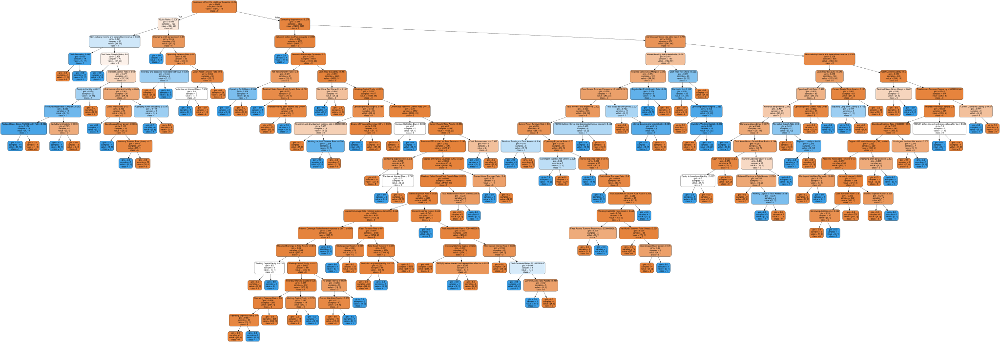

In [94]:
import graphviz 
from sklearn import tree
dot_data = tree.export_graphviz(dt_model, out_file=None, 
                      feature_names=list(x_train.columns),  
                      class_names=[str(s) for s in y_train.unique()],  
                      filled=True, rounded=True,  
                      special_characters=True)  
graph = graphviz.Source(dot_data)  
graph 

In [95]:
graph.render("decision_tree")

'decision_tree.pdf'

In [ ]:
#This decision tree indicates that EPS is the main determinant on whether a company is bankrupt or not, however it is based on the V2 dataset (can see since labels are names not numbers) so we caould make a decision tree based on the final filtered data and V3 dataset to get a more trusted model. This model still has good accuracy but random forest works better for data from the outside as it is not affected by outside data as much.

In [ ]:
#Decsion Tree extracted from random forest made with V3 dataset

In [111]:
print("Selected features:", selected_features)
print("Filter mask:", filter_mask)
print("Filtered features:", selected_features[filter_mask])

Selected features: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67]
Filter mask: [False False False False False False False False  True False False False
 False False False False False False False False False False False  True
 False False  True False False False False False False False False False
 False  True False False False False False False False False  True False
  True False False False False False False False False False False  True
  True  True False False  True False False False]
Filtered features: [ 8 23 26 37 46 48 59 60 61 64]


In [110]:
# Get the original feature names from the bankruptcy_df
original_feature_names = list(bankruptcy_df.columns)

# Map the indices in selected_features to their corresponding names
selected_feature_names = [original_feature_names[i] for i in selected_features]

print("Selected feature names:", selected_feature_names)

# Map the indices in selected_features[filter_mask] to their corresponding names
filtered_feature_names = [original_feature_names[i] for i in selected_features[filter_mask]]

print("Filtered feature names:", filtered_feature_names)

Selected feature names: ['Bankrupt?', ' ROA(C) before interest and depreciation before interest', ' ROA(A) before interest and % after tax', ' ROA(B) before interest and depreciation after tax', ' Operating Gross Margin', ' Realized Sales Gross Margin', ' Operating Profit Rate', ' Pre-tax net Interest Rate', ' After-tax net Interest Rate', ' Non-industry income and expenditure/revenue', ' Continuous interest rate (after tax)', ' Operating Expense Rate', ' Research and development expense rate', ' Cash flow rate', ' Interest-bearing debt interest rate', ' Tax rate (A)', ' Net Value Per Share (B)', ' Net Value Per Share (A)', ' Net Value Per Share (C)', ' Persistent EPS in the Last Four Seasons', ' Cash Flow Per Share', ' Revenue Per Share (Yuan ¥)', ' Operating Profit Per Share (Yuan ¥)', ' Per Share Net profit before tax (Yuan ¥)', ' Realized Sales Gross Profit Growth Rate', ' Operating Profit Growth Rate', ' After-tax Net Profit Growth Rate', ' Regular Net Profit Growth Rate', ' Conti

In [ ]:
#x filtered 3 columns labeled in numbers so will use this as a key to see which one is the root of the decision tree based on random forest of V3 data

In [99]:
from sklearn.ensemble import RandomForestClassifier

# Prepare the data
X = Filtered3_df[selected_features[filter_mask]]
Y = Filtered3_df['Bankrupt?']

# Create a random forest model
model = RandomForestClassifier(n_estimators=10)

# Train the model
model.fit(X, Y)

# Extract a single tree
estimator = model.estimators_[5]

In [ ]:
from sklearn.tree import export_graphviz
# Ensure all feature names are strings
selected_features = [str(f) for f in selected_features]  

# Ensure filter_mask is boolean
filter_mask = filter_mask.astype(bool)  

# Apply filter_mask properly using list comprehension
feature_names = [selected_features[i] for i in range(len(selected_features)) if filter_mask[i]]

# Export as dot file
export_graphviz(
    estimator,
    out_file='tree.dot',
    feature_names=feature_names,  # Use the properly filtered list
    class_names=['Not Bankrupt', 'Bankrupt'],
    rounded=True, proportion=False,
    precision=2, filled=True
)


In [101]:
from subprocess import call

# Convert to png
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

0

In [108]:
from IPython.display import Image

# Display in Jupyter Notebook
Image(filename='tree.png')

In [ ]:
#From the decision tree based on random forest of the V3 data we can see trhat 64 which is current liabilities/ liability is the greatest determinant. This is mostlikely more reliable as it is based on random forest so it is less affected by outside data and less risk of iverfitting (especially since it has less features since to uses the V3 filtered dataset which has less features) 

In [109]:
from IPython.display import FileLink
FileLink('tree.png')

C:\Users\azizm\Desktop\tree.png

In [ ]:
#The model I recommend using is random forest filtered 3 as it has less features, less multicolinearity and a high accuracy which will cause less overfitting and better results for outside data (instead of using the random forest original which had high accuracy but has a lot of features, also instead of logistic regression V3 which had higher accuracy since random forests purpose is to oresent overfitting)